In [20]:

!pip3 install keras-ocr # for keras-ocr
!pip3 install pytesseract # pytesseract OCR installation
!pip3 install pdf2image

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [21]:
# 
# Install Chinese Simplified language pack
# !apt-get install tesseract-ocr-chi-sim

# import 

In [117]:
from IPython.display import HTML, Markdown, clear_output, display, Image

In [118]:
import pytesseract
from pdf2image import convert_from_path
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [119]:
fileName = "./functionalSample.pdf"
pdfFile1 = "./HK_Cantonese-RiddlesV1.pdf"

In [120]:
def convertPDFToImage(fileName):
    images = convert_from_path(fileName)
    return images

In [121]:
images1 = convertPDFToImage(fileName)

In [122]:
len(images1)

1

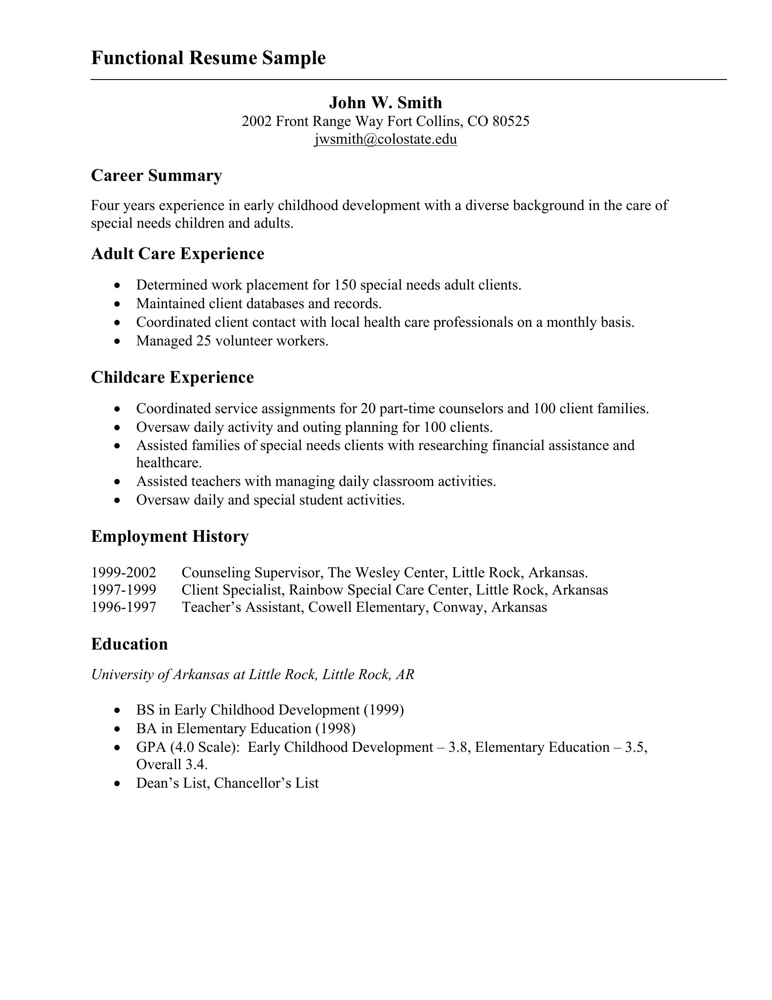

In [123]:
display(images1[0])

In [124]:
image2= convertPDFToImage(pdfFile1)
len(image2)

59

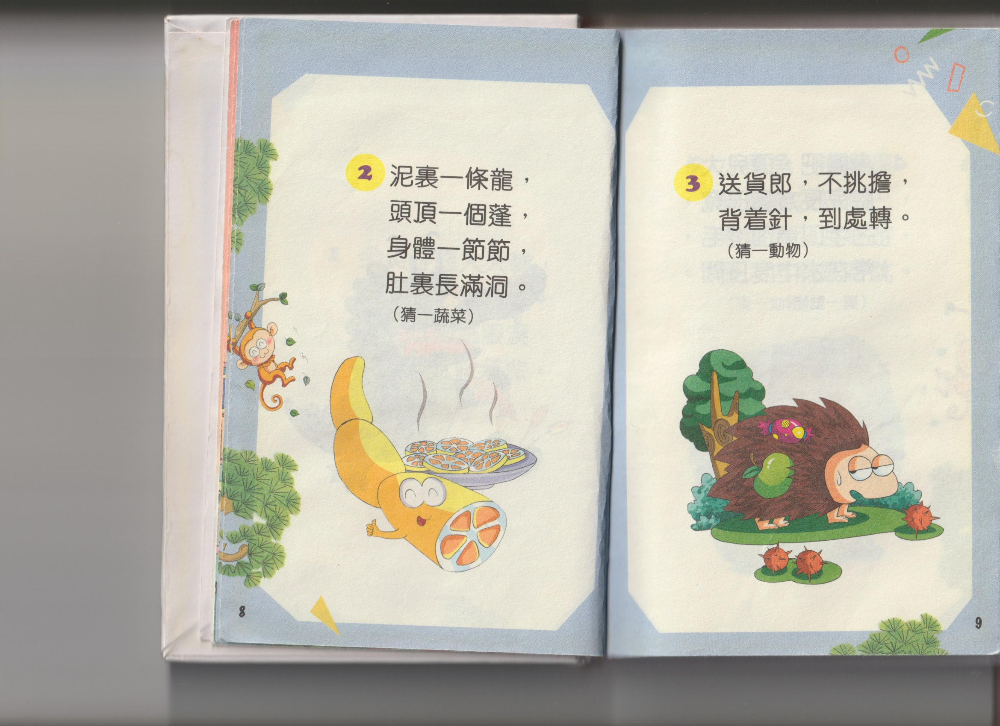

In [125]:
display(image2[1])

In [126]:

def checkOCRSupportLanguages():
    return pytesseract.get_languages()

def extractOCRImage(image, lang='eng'):
    text = pytesseract.image_to_string(image, lang=lang)
    return text

def extractOCRImageDetails(image, lang='eng', outFormat=pytesseract.Output.DICT):
    details = pytesseract.image_to_data(image, lang=lang, output_type=outFormat)
    return details

def getImageBoundingBox(image):
    return pytesseract.image_to_boxes(image)

def drawBoundingBox(image, boxes):
    opencvImage = np.array(image)
    # cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
    for b in boxes.splitlines():
        b = b.split(' ')
        img = cv2.rectangle(opencvImage, (int(b[1]), int(b[2])), (int(b[3]), int(b[4])), (0, 255, 0), 2)
    
    # cv2.imshow('Result', img) # not working in Jupyter
    # cv2.waitKey(0) 
    plt.imshow(img)
    plt.show()
    # return image

In [127]:
checkOCRSupportLanguages()

['chi_sim', 'chi_tra', 'eng', 'osd']

In [128]:
text = extractOCRImage(images1[0])

In [129]:
print(text)

Functional Resume Sample

 

John W. Smith
2002 Front Range Way Fort Collins, CO 80525

jwsmith@colostate.edu

Career Summary

Four years experience in early childhood development with a diverse background in the care of
special needs children and adults.

Adult Care Experience

Determined work placement for 150 special needs adult clients.

Maintained client databases and records.

Coordinated client contact with local health care professionals on a monthly basis.
Managed 25 volunteer workers.

Childcare Experience

e Coordinated service assignments for 20 part-time counselors and 100 client families.

e Oversaw daily activity and outing planning for 100 clients.

e Assisted families of special needs clients with researching financial assistance and
healthcare.

e Assisted teachers with managing daily classroom activities.

e Oversaw daily and special student activities.

Employment History

1999-2002 Counseling Supervisor, The Wesley Center, Little Rock, Arkansas.
1997-1999 Client Sp

In [130]:
text2 = extractOCRImage(image2[2], lang='chi_tra+eng')
print(text2)

身體肥,頭兒大, | See eae.
RRRSBES. |   圓圓腦袋短尾巴 ,
名字叫馬卻沒毛, |   池塘裏面游呀游,
常在水中度日閒。 |   長大才能跳呀跳。

(猜一動物)                                                     (猜一動物)

 

 

 

 



In [131]:
dictText2 = extractOCRImageDetails(image2[2], lang='chi_tra+eng', outFormat='data.frame') # pandas dataframe format+
print(dictText2)

    level  page_num  block_num  par_num  line_num  word_num  left   top   
0       1         1          0        0         0         0     0     0  \
1       2         1          1        0         0         0   484   478   
2       3         1          1        1         0         0   484   478   
3       4         1          1        1         1         0   497   478   
4       5         1          1        1         1         1   497   478   
..    ...       ...        ...      ...       ...       ...   ...   ...   
81      5         1          5        1         1         1   101  1077   
82      2         1          6        0         0         0     0     0   
83      3         1          6        1         0         0     0     0   
84      4         1          6        1         1         0     0     0   
85      5         1          6        1         1         1     0     0   

    width  height  conf text  
0    2339    1700    -1  NaN  
1    1265     339    -1  NaN  
2    1

In [132]:
type(dictText2)

pandas.core.frame.DataFrame

In [133]:
dictText2

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,1,1,0,0,0,0,0,0,2339,1700,-1,NaN
1,2,1,1,0,0,0,484,478,1265,339,-1,NaN
2,3,1,1,1,0,0,484,478,1265,339,-1,NaN
3,4,1,1,1,1,0,497,478,1250,87,-1,NaN
4,5,1,1,1,1,1,497,478,171,61,93,身體
...,...,...,...,...,...,...,...,...,...,...,...,...
81,5,1,5,1,1,1,101,1077,31,556,95,
82,2,1,6,0,0,0,0,0,2339,1700,-1,NaN
83,3,1,6,1,0,0,0,0,2339,1700,-1,NaN
84,4,1,6,1,1,0,0,0,2339,1700,-1,NaN


In [134]:
# dictText2["level"]

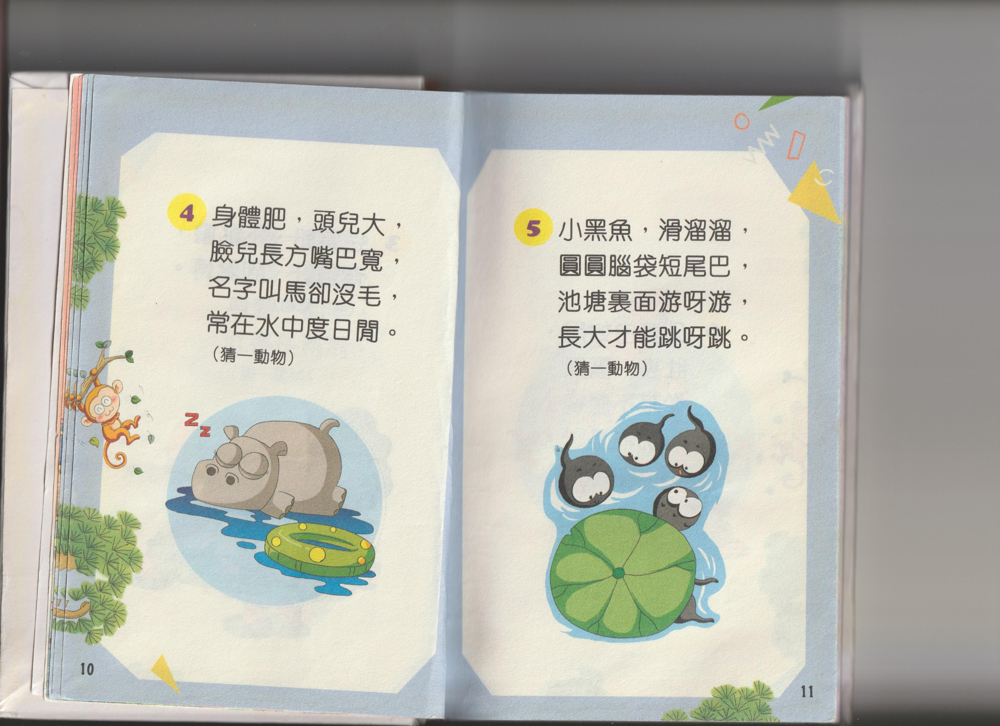

In [135]:
display(image2[2])

In [136]:
boxes = getImageBoundingBox(image2[1])
print(boxes)

2 837 1277 871 1313 0
j 913 1253 951 1315 0
e 913 1262 966 1315 0
— 971 1259 1083 1313 0
( 1060 1253 1119 1315 0
K 1088 1255 1142 1309 0
t 1126 1253 1171 1315 0
e 1146 1253 1236 1307 0
3 1604 1251 1638 1290 0
S 1681 1243 1794 1297 0
B 1776 1243 1835 1298 0
R 1802 1244 1850 1298 0
A 1914 1245 1969 1296 0
d 1973 1246 2121 1301 0
S 897 1146 943 1235 0
R 909 1177 964 1231 0
I 967 1176 1002 1228 0
{ 1068 1198 1080 1205 0
B 1085 1172 1137 1225 0
S 1142 1169 1187 1224 0
» 1225 1188 1232 1201 0
A 1682 1159 1716 1218 0
S 1682 1159 1734 1212 0
S 1741 1162 1795 1215 0
G 1774 1159 1834 1218 0
t 1798 1161 2125 1218 0
» 1870 1149 1901 1238 0
B 1900 1159 1975 1218 0
R 1937 1159 2042 1218 0
S 2034 1159 2079 1218 0
- 2078 1149 2109 1238 0
E 906 1094 961 1150 0
y 926 1082 974 1154 0
e 966 1093 1016 1147 0
— 1022 1115 1076 1121 0
e 1080 1088 1135 1144 0
i 1100 1082 1148 1154 0
a 1130 1082 1166 1154 0
p 1138 1086 1184 1142 0
( 1704 1094 1714 1131 0
7 1720 1095 1756 1131 0
S 1759 1096 1872 1132 0
) 1879 10

In [137]:
len(boxes)

1262

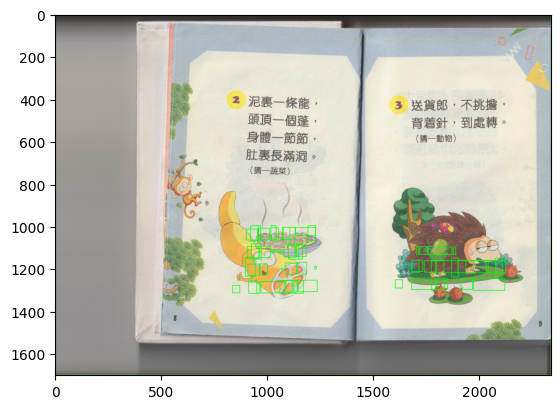

In [138]:
drawBoundingBox(image2[1], boxes)

In [139]:
type(image2[1])

PIL.PpmImagePlugin.PpmImageFile